# Text Mining Data Preparation
Data file
* https://raw.githubusercontent.com/vjavaly/Baruch-CIS-9665/refs/heads/main/data/US_senators_tweets_2020_135k.csv

## Our goal:

This project utilizes the `US_senators_tweets_2020` dataset to investigate whether the language used by politicians on Twitter correlates with their success in the 2020 election.

Key Objectives:
- Analyze the sentiment of tweets and determine if language positivity/negativity is associated with election outcomes.
- Conduct additional demographic and regional analyses to explore patterns, such as:
  - Are certain regions more likely to have senators using positive or negative language?
  - Do age groups of US senators influence their sentiment expression on Twitter?


In [ ]:
from datetime import datetime
print(f'Run time: {datetime.now().strftime("%D %T")}')

Run time: 05/15/25 14:37:52


In [ ]:
# pip install lxml

### Import Libraries

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import nltk
import seaborn as sns
import requests
from nltk.tokenize import word_tokenize
from nltk.corpus import wordnet
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer
from nltk.sentiment import SentimentIntensityAnalyzer
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import ConfusionMatrixDisplay
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report
from sklearn.metrics import ConfusionMatrixDisplay
from sklearn.svm import SVC
from sklearn import metrics
from sklearn.metrics import roc_curve
from sklearn.metrics import roc_auc_score
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from wordcloud import WordCloud
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score
from sklearn.naive_bayes import MultinomialNB

In [ ]:
nltk.download('wordnet')
nltk.download('stopwords')
nltk.download('punkt_tab')
nltk.download('averaged_perceptron_tagger_eng')
nltk.download('vader_lexicon')

[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package punkt_tab to /root/nltk_data...
[nltk_data]   Package punkt_tab is already up-to-date!
[nltk_data] Downloading package averaged_perceptron_tagger_eng to
[nltk_data]     /root/nltk_data...
[nltk_data]   Package averaged_perceptron_tagger_eng is already up-to-
[nltk_data]       date!
[nltk_data] Downloading package vader_lexicon to /root/nltk_data...
[nltk_data]   Package vader_lexicon is already up-to-date!


True

## Load Data

### Primary Data Source

In [ ]:
df1= pd.read_csv('https://raw.githubusercontent.com/vjavaly/Baruch-CIS-9665/refs/heads/main/data/US_senators_tweets_2020_135k.csv')

### Secondary Data Source

In [ ]:
# Webscrape table of active US Senators from Wikipedia
url = 'https://en.wikipedia.org/wiki/List_of_current_United_States_senators'

r = requests.get(url)
df_webscrape = pd.read_html(r.text) # this parses all the tables in webpages to a list
senator_wiki = df_webscrape[5]
senator_wiki['birth_year'] = senator_wiki['Born'].str.extract(r'(\d{4})').astype(float)
senator_wiki['Age'] = 2020 - senator_wiki['birth_year']
senator_wiki = senator_wiki.drop(['Portrait', 'Party', 'Occupation(s)', 'Previous elective office(s)', 'Education',
                            'Residence[4]', 'Class', 'Assumed office', 'Born', 'birth_year'], axis=1)
senator_wiki = senator_wiki.rename(columns={'Party.1': 'Party'})
senator_wiki.head()

<ipython-input-6-08f5baaecdb3>:5: FutureWarning: Passing literal html to 'read_html' is deprecated and will be removed in a future version. To read from a literal string, wrap it in a 'StringIO' object.
  df_webscrape = pd.read_html(r.text) # this parses all the tables in webpages to a list


,State,Senator,Party,Age
0,Alabama,Tommy Tuberville,Republican,66.0
1,Alabama,Katie Britt,Republican,38.0
2,Alaska,Lisa Murkowski,Republican,63.0
3,Alaska,Dan Sullivan,Republican,56.0
4,Arizona,Mark Kelly,Democratic,56.0


In [ ]:
# Due to gaps between tweet data & active senators, we've researched delta & joined to Wiki table
data = {

    'State': ['Maryland', 'New Mexico', 'Nebraska', 'Pennsylvania', 'New Jersey', 'Michigan', 'California',
              'Oklahoma', 'West Virginia', 'Montana', 'Arizona', 'Florida', 'Indiana', 'Utah', 'Pennsylvania',
              'Vermont', 'North Carolina', 'Illinois', 'Alabama', 'Ohio', 'Missouri', 'Ohio', 'Delaware'],

    'Senator': ['Ben Cardin', 'Ben Ray Lujan', 'Ben Sasse', 'Bob Casey Jr.', 'Bob Menendez', 'Debbie Stabenow',
                 'Dianne Feinstein', 'Jim Inhofe', 'Joe Manchin', 'Jon Tester', 'Kyrsten Sinema',  'Marco Rubio',
                 'Mike Braun', 'Mitt Romney', 'Pat Toomey', 'Patrick Leahy',  'Richard Burr', 'Richard Durbin',
                 'Richard Shelby', 'Rob Portman', 'Roy Blunt', 'Sherrod Brown','Tom Carper'],

    'Age': [77, 48, 48, 60, 66, 70, 87, 86, 73, 64, 44, 49, 66, 73, 59, 80, 65, 76, 86, 65, 70, 68, 73],

    'Party': ['Democratic', 'Democratic', 'Republican', 'Democratic', 'Democratic', 'Democratic', 'Democratic',
              'Republican', 'Democratic', 'Democratic', 'Democratic', 'Republican', 'Republican', 'Republican',
              'Republican', 'Democratic', 'Republican', 'Democratic', 'Republican', 'Republican', 'Republican',
              'Democratic', 'Democratic']}

senator_1 = pd.DataFrame(data)
senator_master = pd.concat([senator_wiki, senator_1], ignore_index=True)
senator_master.head(5)

,State,Senator,Party,Age
0,Alabama,Tommy Tuberville,Republican,66.0
1,Alabama,Katie Britt,Republican,38.0
2,Alaska,Lisa Murkowski,Republican,63.0
3,Alaska,Dan Sullivan,Republican,56.0
4,Arizona,Mark Kelly,Democratic,56.0


In [ ]:
# To successfully join this information to tweets data, we've built a data dictionary
senator_2 = {
    'Username': ['TTuberville', 'SenShelby', 'lisamurkowski', 'SenDanSullivan', 'SenMarkKelly', 'SenatorSinema', 'JohnBoozman', 'SenTomCotton',
                 'SenFeinstein', 'SenatorBennet', 'SenBlumenthal', 'ChrisCoons', 'SenatorCarper', 'SenRickScott', 'SenRubioPress', 'SenBrianSchatz',
                 'maziehirono', 'MikeCrapo', 'SenatorRisch', 'SenatorDurbin', 'SenDuckworth', 'SenToddYoung', 'SenatorBraun', 'ChuckGrassley',
                 'SenJoniErnst', 'JerryMoran', 'RogerMarshallMD', 'RandPaul', 'SenBillCassidy', 'SenJohnKennedy', 'SenatorCollins', 'SenAngusKing',
                 'ChrisVanHollen', 'SenatorCardin', 'SenWarren', 'SenMarkey', 'SenGaryPeters', 'SenStabenow', 'SenAmyKlobuchar', 'SenTinaSmith',
                 'SenatorWicker', 'SenHydeSmith', 'SenHawleyPress', 'RoyBlunt', 'SteveDaines', 'SenatorTester', 'SenatorFischer', 'SenSasse',
                 'SenCortezMasto', 'SenJackyRosen', 'SenatorShaheen', 'SenatorHassan', 'SenBooker', 'SenatorMenendez', 'MartinHeinrich', 'SenatorLujan',
                 'SenSchumer', 'gillibrandny', 'SenThomTillis', 'SenatorBurr', 'SenJohnHoeven', 'SenKevinCramer', 'SenSherrodBrown', 'senrobportman',
                 'SenatorLankford', 'JimInhofe', 'RonWyden', 'SenJeffMerkley', 'SenToomey', 'SenBobCaseyfe', 'SenJackReed', 'SenWhitehouse', 'LindseyGrahamSC',
                 'SenatorTimScott', 'SenJohnThune', 'SenatorRounds', 'MarshaBlackburn', 'BillHagertyTN', 'JohnCornyn', 'SenTedCruz', 'SenMikeLee', 'SenatorRomney',
                 'SenSanders', 'SenatorLeahy', 'MarkWarner', 'timkaine', 'PattyMurray', 'SenatorCantwell', 'SenCapito', 'Sen_JoeManchin', 'SenRonJohnson',
                 'SenatorBaldwin', 'SenJohnBarrasso'],

    'Senator': ['Tommy Tuberville', 'Richard Shelby', 'Lisa Murkowski', 'Dan Sullivan', 'Mark Kelly', 'Kyrsten Sinema', 'John Boozman', 'Tom Cotton',
                'Dianne Feinstein', 'Michael Bennet', 'Richard Blumenthal', 'Chris Coons', 'Tom Carper', 'Rick Scott', 'Marco Rubio', 'Brian Schatz',
                'Mazie Hirono', 'Mike Crapo', 'Jim Risch', 'Richard Durbin', 'Tammy Duckworth', 'Todd Young', 'Mike Braun', 'Chuck Grassley',
                'Joni Ernst', 'Jerry Moran', 'Roger Marshall', 'Rand Paul', 'Bill Cassidy', 'John Kennedy', 'Susan Collins', 'Angus King', 'Chris Van Hollen',
                'Ben Cardin', 'Elizabeth Warren', 'Ed Markey', 'Gary Peters', 'Debbie Stabenow', 'Amy Klobuchar', 'Tina Smith', 'Roger Wicker',
                'Cindy Hyde-Smith', 'Josh Hawley', 'Roy Blunt', 'Steve Daines', 'Jon Tester', 'Deb Fischer', 'Ben Sasse', 'Catherine Cortez Masto',
                'Jacky Rosen', 'Jeanne Shaheen', 'Maggie Hassan', 'Cory Booker', 'Bob Menendez', 'Martin Heinrich', 'Ben Ray Lujan', 'Chuck Schumer',
                'Kirsten Gillibrand', 'Thom Tillis', 'Richard Burr', 'John Hoeven', 'Kevin Cramer', 'Sherrod Brown', 'Rob Portman', 'James Lankford',
                'Jim Inhofe', 'Ron Wyden', 'Jeff Merkley', 'Pat Toomey', 'Bob Casey Jr.', 'Jack Reed', 'Sheldon Whitehouse', 'Lindsey Graham',
                'Tim Scott', 'John Thune', 'Mike Rounds', 'Marsha Blackburn', 'Bill Hagerty', 'John Cornyn', 'Ted Cruz', 'Mike Lee', 'Mitt Romney',
                'Bernie Sanders', 'Patrick Leahy', 'Mark Warner', 'Tim Kaine', 'Patty Murray', 'Maria Cantwell', 'Shelley Moore Capito', 'Joe Manchin',
                'Ron Johnson', 'Tammy Baldwin', 'John Barrasso']}

senator_2 = pd.DataFrame(senator_2)
senator_master = pd.merge(senator_master, senator_2, on='Senator', how='inner')
senator_master.head(5)

,State,Senator,Party,Age,Username
0,Alabama,Tommy Tuberville,Republican,66.0,TTuberville
1,Alaska,Lisa Murkowski,Republican,63.0,lisamurkowski
2,Alaska,Dan Sullivan,Republican,56.0,SenDanSullivan
3,Arizona,Mark Kelly,Democratic,56.0,SenMarkKelly
4,Arkansas,John Boozman,Republican,70.0,JohnBoozman


In [ ]:
# Additional research was done to explore election results as part of our proposed research questions

senator_3 = {

    'Username': ['TTuberville', 'SenShelby', 'lisamurkowski', 'SenDanSullivan', 'SenMarkKelly', 'SenatorSinema', 'JohnBoozman',
                 'SenTomCotton', 'SenFeinstein', 'SenatorBennet', 'SenBlumenthal', 'ChrisCoons', 'SenatorCarper', 'SenRickScott',
                 'SenRubioPress', 'SenBrianSchatz', 'maziehirono', 'MikeCrapo', 'SenatorRisch', 'SenatorDurbin', 'SenDuckworth',
                 'SenToddYoung', 'SenatorBraun', 'ChuckGrassley', 'SenJoniErnst', 'JerryMoran', 'RogerMarshallMD', 'RandPaul',
                 'SenBillCassidy', 'SenJohnKennedy', 'SenatorCollins', 'SenAngusKing', 'ChrisVanHollen', 'SenatorCardin',
                 'SenWarren', 'SenMarkey', 'SenGaryPeters', 'SenStabenow', 'SenAmyKlobuchar', 'SenTinaSmith', 'SenatorWicker',
                 'SenHydeSmith', 'SenHawleyPress', 'RoyBlunt', 'SteveDaines', 'SenatorTester', 'SenatorFischer', 'SenSasse',
                 'SenCortezMasto', 'SenJackyRosen', 'SenatorShaheen', 'SenatorHassan', 'SenBooker', 'SenatorMenendez',
                 'MartinHeinrich', 'SenatorLujan', 'SenSchumer', 'gillibrandny', 'SenThomTillis', 'SenatorBurr', 'SenJohnHoeven',
                 'SenKevinCramer', 'SenSherrodBrown', 'senrobportman', 'SenatorLankford', 'JimInhofe', 'RonWyden', 'SenJeffMerkley',
                 'SenToomey', 'SenBobCaseyfe', 'SenJackReed', 'SenWhitehouse', 'LindseyGrahamSC', 'SenatorTimScott', 'SenJohnThune',
                 'SenatorRounds', 'MarshaBlackburn', 'BillHagertyTN', 'JohnCornyn', 'SenTedCruz', 'SenMikeLee', 'SenatorRomney',
                 'SenSanders', 'SenatorLeahy', 'MarkWarner', 'timkaine', 'PattyMurray', 'SenatorCantwell', 'SenCapito',
                 'Sen_JoeManchin', 'SenRonJohnson', 'SenatorBaldwin', 'SenJohnBarrasso'],

    'Election Winner': ['Yes', 'Did not seek relection', 'Yes', 'Yes', 'Yes', 'Did not seek relection', 'Yes', 'Yes', 'Did not seek relection',
                        'Yes', 'Yes', 'Yes', 'Did not seek relection', 'Yes', 'Yes', 'Yes', 'Yes', 'Yes', 'Yes', 'Yes', 'Yes', 'Yes',
                        'Did not seek relection', 'Yes', 'Yes', 'Yes', 'Yes', 'Yes', 'Yes', 'Yes', 'Yes', 'Yes', 'Yes',
                        'Did not seek relection', 'Yes', 'Yes', 'Yes', 'Did not seek relection', 'Yes', 'Yes', 'Yes', 'Yes', 'Yes',
                        'Did not seek relection', 'Yes', 'No', 'Yes', 'Yes', 'Yes', 'Yes', 'Yes', 'Yes', 'Yes', 'Did not seek relection',
                        'Yes', 'Yes', 'Yes', 'Yes', 'Yes', 'Did not seek relection', 'Yes', 'Yes', 'No', 'Did not seek relection', 'Yes',
                        'Yes', 'Yes', 'Yes', 'Did not seek relection', 'No', 'Yes', 'Yes', 'Yes', 'Yes', 'Yes', 'Yes', 'Yes', 'Yes', 'Yes',
                        'Yes', 'Yes', 'Did not seek relection', 'Yes', 'Did not seek relection', 'Yes', 'Yes', 'Yes', 'Yes', 'Yes',
                        'Did not seek relection', 'Yes', 'Yes', 'Yes'],

    'Election Year': [2020, 2022, 2022, 2020, 2020, 2024, 2022, 2020, 2024, 2022, 2022, 2020, 2024, 2024, 2022, 2022, 2024, 2022, 2020,
                      2020, 2022, 2022, 2024, 2022, 2020, 2022, 2020, 2022, 2020, 2022, 2020, 2024, 2022, 2024, 2024, 2020, 2020, 2024,
                      2024, 2020, 2024, 2020, 2024, 2022, 2020, 2024, 2024, 2020, 2022, 2024, 2020, 2022, 2020, 2024, 2024, 2020, 2022,
                      2024, 2020, 2022, 2022, 2024, 2024, 2022, 2022, 2020, 2022, 2020, 2022, 2024, 2020, 2024, 2020, 2022, 2022, 2020,
                      2024, 2020, 2020, 2024, 2022, 2024, 2024, 2022, 2020, 2024, 2022, 2024, 2020, 2024, 2022, 2024, 2024],

    'Incumbent': ['No', 'Yes', 'Yes', 'Yes', 'No', 'Yes', 'Yes', 'Yes', 'Yes', 'Yes', 'Yes', 'Yes', 'Yes', 'Yes', 'Yes', 'Yes', 'Yes', 'Yes',
                  'Yes', 'Yes', 'Yes', 'Yes', 'Yes', 'Yes', 'Yes', 'Yes', 'No', 'Yes', 'Yes', 'Yes', 'Yes', 'Yes', 'Yes', 'Yes', 'Yes', 'Yes',
                  'Yes', 'Yes', 'Yes', 'Yes', 'Yes', 'Yes', 'Yes', 'Yes', 'Yes', 'Yes', 'Yes', 'Yes', 'Yes', 'Yes', 'Yes', 'Yes', 'Yes', 'Yes',
                  'Yes', 'No', 'Yes', 'Yes', 'Yes', 'Yes', 'Yes', 'Yes', 'Yes', 'Yes', 'Yes', 'Yes', 'Yes', 'Yes', 'Yes', 'Yes', 'Yes', 'Yes',
                  'Yes', 'Yes', 'Yes', 'Yes', 'Yes', 'No', 'Yes', 'Yes', 'Yes', 'Yes', 'Yes', 'Yes', 'Yes', 'Yes', 'Yes', 'Yes', 'Yes', 'Yes',
                  'Yes', 'Yes', 'Yes'],

    'Margin': [20.4, None, 6.3, 12.7, 2.3, None, 34.7, 33.1, None, 14.6, 14.9, 21.5, None, 12.8, 16.4, 45.1, 32.7, 31.9, 29.4, 16.1, 15.3, 20.8,
               None, 12.2, 6.6, 23, 11.4, 23.6, 40.3, 43.7, 8.6, 17.3, 31.7, None, 19.8, 33.1, 1.7, None, 15.7, 5.3, 25.6, 10, 13.7, None, 10,
               -7.1, 6.7, 38.3, 0.7, 1.6, 15.7, 9.1, 16.3, None, 10.1, 6.1, 14, 18.3, 1.8, None, 31.3, 32.9, -3.6, None, 32.2, 30.2, 14.9, 17.6,
               None, -0.2, 33.1, 20.1, 10.3, 25.9, 43.5, 31.5, 29.6, 27, 9.6, 8.5, 10.4, None, 31.1, None, 12.1, 8.9, 14.5, 18.5, 43.3, None, 1, 0.9, 51]

}

senator_3 = pd.DataFrame(senator_3)
df2 = pd.merge(senator_master, senator_3, on='Username', how='inner')
df2.head(5)

,State,Senator,Party,Age,Username,Election Winner,Election Year,Incumbent,Margin
0,Alabama,Tommy Tuberville,Republican,66.0,TTuberville,Yes,2020,No,20.4
1,Alaska,Lisa Murkowski,Republican,63.0,lisamurkowski,Yes,2022,Yes,6.3
2,Alaska,Dan Sullivan,Republican,56.0,SenDanSullivan,Yes,2020,Yes,12.7
3,Arizona,Mark Kelly,Democratic,56.0,SenMarkKelly,Yes,2020,No,2.3
4,Arkansas,John Boozman,Republican,70.0,JohnBoozman,Yes,2022,Yes,34.7


## Examine Data

In [ ]:
pd.set_option('max_colwidth', None)

### Primary Data

In [ ]:
df1.head()

,Unnamed: 0,username,date,tweet_id,tweet_content,tweet_url
0,0,lisamurkowski,2020-12-31 18:06:21+00:00,1344706472052142083,Alaskans have proven their resilience time and time again in the face of disaster. I remain committed to helping equip them with the tools and resources they need to keep Alaskans across the state as safe as possible. https://t.co/T2M6Oh1SyA,https://twitter.com/lisamurkowski/status/1344706472052142083
1,1,lisamurkowski,2020-12-31 18:06:20+00:00,1344706470055714819,"I’m proud that my Interior Appropriations bill, which was recently signed into law, takes important steps to further develop &amp; improve earthquake &amp; volcano monitoring capabilities, modernize 3D Alaska mapping, &amp; provide support for wildland fire management &amp; suppression. https://t.co/2uTgDOvarn",https://twitter.com/lisamurkowski/status/1344706470055714819
2,2,lisamurkowski,2020-12-30 01:13:26+00:00,1344089179207118848,"I’m proud that the nearly $900 billion #COVID19 Relief package, which was recently signed into law, includes significant funding to support another round of #PPP to our hardest-hit small businesses in desperate need of assistance. https://t.co/m2rmAy7VZq",https://twitter.com/lisamurkowski/status/1344089179207118848
3,3,lisamurkowski,2020-12-30 01:13:26+00:00,1344089177663688704,The Paycheck Protection Program has been critical in helping American workers and small businesses navigate the #COVID19 pandemic. https://t.co/OnI8r8Ek4t,https://twitter.com/lisamurkowski/status/1344089177663688704
4,4,lisamurkowski,2020-12-29 00:59:39+00:00,1343723320030744578,"Reaching this agreement took significant bipartisan compromise from members across the board, and I’m proud to have been a part of that good work. The President’s decision to sign this legislation without further delay, which includes critical #COVID19 relief, is welcomed news.",https://twitter.com/lisamurkowski/status/1343723320030744578


In [ ]:
df1.shape

(73111, 6)

In [ ]:
df1.isnull().sum()

,0
Unnamed: 0,0
username,0
date,0
tweet_id,0
tweet_content,0
tweet_url,0


### Secondary Data

In [ ]:
df2.head()

,State,Senator,Party,Age,Username,Election Winner,Election Year,Incumbent,Margin
0,Alabama,Tommy Tuberville,Republican,66.0,TTuberville,Yes,2020,No,20.4
1,Alaska,Lisa Murkowski,Republican,63.0,lisamurkowski,Yes,2022,Yes,6.3
2,Alaska,Dan Sullivan,Republican,56.0,SenDanSullivan,Yes,2020,Yes,12.7
3,Arizona,Mark Kelly,Democratic,56.0,SenMarkKelly,Yes,2020,No,2.3
4,Arkansas,John Boozman,Republican,70.0,JohnBoozman,Yes,2022,Yes,34.7


In [ ]:
df2.shape

(93, 9)

## Clean Data 1

In [ ]:
df1['username'].unique()

array(['lisamurkowski', 'SenDanSullivan', 'TTuberville', 'SenShelby',
       'JohnBoozman', 'SenTomCotton', 'SenMarkKelly', 'SenatorSinema',
       'SenFeinstein', 'SenatorBennet', 'SenBlumenthal', 'SenatorCarper',
       'ChrisCoons', 'SenRubioPress', 'SenRickScott', 'maziehirono',
       'SenBrianSchatz', 'SenJoniErnst', 'ChuckGrassley', 'MikeCrapo',
       'SenatorRisch', 'SenDuckworth', 'SenatorDurbin', 'SenatorBraun',
       'SenToddYoung', 'JerryMoran', 'RogerMarshallMD', 'RandPaul',
       'SenBillCassidy', 'SenJohnKennedy', 'SenMarkey', 'SenWarren',
       'SenatorCardin', 'ChrisVanHollen', 'SenatorCollins',
       'SenAngusKing', 'SenGaryPeters', 'SenStabenow', 'SenAmyKlobuchar',
       'SenTinaSmith', 'RoyBlunt', 'SenHawleyPress', 'SenHydeSmith',
       'SenatorWicker', 'SteveDaines', 'SenatorTester', 'SenatorBurr',
       'SenThomTillis', 'SenKevinCramer', 'SenJohnHoeven',
       'SenatorFischer', 'SenSasse', 'SenatorHassan', 'SenatorShaheen',
       'SenBooker', 'SenatorMen

## Clean Data 2

In [ ]:
# Standardize Column Names
df2.columns = ['state', 'senator', 'party', 'age', 'username', 'election_winner',
              'election_year', 'incumbent', 'margin_of_victory']

#Handle Missing Values
df2.isnull().sum()  # See missing values

#Alternatively, fill missing values:
df2['age'].fillna(df2['age'].median(), inplace=True)
df2['margin_of_victory'].fillna(0, inplace=True)  # Replace with 0 if appropriate

# Convert Data Types
df2['age'] = pd.to_numeric(df2['age'], errors='coerce')
df2['election_year'] = pd.to_numeric(df2['election_year'], errors='coerce')
df2['margin_of_victory'] = pd.to_numeric(df2['margin_of_victory'], errors='coerce')
df2['state'] = df2['state'].astype('category')
df2['party'] = df2['party'].astype('category')
df2['election_winner'] = df2['election_winner'].astype('bool')  # If it's a True/False value
df2['incumbent'] = df2['incumbent'].astype('bool')

#Remove Duplicates
df2 = df2.drop_duplicates()

#Trim Whitespace & Standardize Text Data
df2['senator'] = df2['senator'].str.strip().str.title()  # Remove spaces and format names
df2['state'] = df2['state'].str.strip().str.upper()  # Standardize state abbreviations
df2['party'] = df2['party'].str.strip().str.title()  # Standardize party names

df2['party'] = (
    df2['party']
      .str.replace(r'\[.*?\]', '', regex=True)
      .str.replace(r'\(Dfl\)', '', regex=True)
      .str.strip())

#Validate Age and Election Year
df2 = df2[(df2['age'] > 25) & (df2['age'] < 100)]  # Filter unrealistic ages

df2.shape

<ipython-input-17-c2c9851dabe6>:9: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df2['age'].fillna(df2['age'].median(), inplace=True)
<ipython-input-17-c2c9851dabe6>:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try

(93, 9)

In [ ]:
df2.head()

,state,senator,party,age,username,election_winner,election_year,incumbent,margin_of_victory
0,ALABAMA,Tommy Tuberville,Republican,66.0,TTuberville,True,2020,True,20.4
1,ALASKA,Lisa Murkowski,Republican,63.0,lisamurkowski,True,2022,True,6.3
2,ALASKA,Dan Sullivan,Republican,56.0,SenDanSullivan,True,2020,True,12.7
3,ARIZONA,Mark Kelly,Democratic,56.0,SenMarkKelly,True,2020,True,2.3
4,ARKANSAS,John Boozman,Republican,70.0,JohnBoozman,True,2022,True,34.7


#   Prepare Data






In [ ]:
# Create new column combined_text
df1['combined_text'] = df1['tweet_content']

In [ ]:
# Initialize the WordNetLemmatizer
lemmatizer = WordNetLemmatizer()

# Create stopwords set
stop_words = set(stopwords.words('english'))

# Function to get the part of speech tag for lemmatization
def get_wordnet_pos(word):
    """Map POS tag to first character lemmatize() accepts"""
    tag = nltk.pos_tag([word])[0][1][0].upper()
    tag_dict = {"J": wordnet.ADJ,
                "N": wordnet.NOUN,
                "V": wordnet.VERB,
                "R": wordnet.ADV}
    return tag_dict.get(tag, wordnet.NOUN)

# Function to clean text
def clean_text(text):
    # Tokenize the text
    tokens = word_tokenize(text)
    # Convert to lowercase
    tokens = [word.lower() for word in tokens]
    # Remove punctuation and stopwords
    tokens = [word for word in tokens if word.isalnum() and word not in stop_words]
    # Lemmatize
    tokens = [lemmatizer.lemmatize(word, get_wordnet_pos(word)) for word in tokens]
    # Remove unwanted tokens
    tokens = [word for word in tokens if word not in {'http', 'amp'}]
    return ' '.join(tokens)

#Applying Clean Funtion
df1['clean_combined_text'] = df1['combined_text'].apply(clean_text)


In [ ]:
# Display a random sample of 5 rows from updated dataframe
df1[['combined_text', 'clean_combined_text']].sample(5)

,combined_text,clean_combined_text
46064,".@SenCortezMasto and I are calling for ramping up #COVID19 testing. \n\nOur public health, government, and business leaders need information about who has COVID-19, who needs to be isolated or quarantined, and who may have already had the virus. https://t.co/feYzGoDBXC",sencortezmasto call ramp covid19 test public health government business leader need information need isolated quarantine may already virus
64697,Does the president realize that unemployment benefits expire the day after Christmas?,president realize unemployment benefit expire day christmas
13387,"Over 87,000 farms make Iowa our nation’s top egg, pork, corn, soybean, and ethanol producer.",farm make iowa nation top egg pork corn soybean ethanol producer
25410,"Incremental reform is not enough. We must do better to end systemic racism in law enforcement and protect the civil rights, human rights and the lives of men, women and children in this country.",incremental reform enough must well end systemic racism law enforcement protect civil right human right life men woman child country
17356,"United States of America:\n\n✅5% of the world’s population\n✅25% of the world’s #COVID19 infections\n \nKeep peddling worthless medical advice, Mr. President.",united state america world population world covid19 infection keep peddle worthless medical advice president


# Sentiment Analysis



In [ ]:
# Instantiate SentimentIntensityAnalyzer
sia = SentimentIntensityAnalyzer()

In [ ]:
%%time

df1['generated_sentiment'] = df1['clean_combined_text'].apply(lambda x: sia.polarity_scores(x)['compound']) # generated sentiment scores
df1['sentiment_label'] = df1['generated_sentiment'].apply(lambda x: 'positive' if x >= 0 else ('negative' if x <= -0 else 'neutral')) # sentiment label for each score
df1[['username', 'generated_sentiment', 'sentiment_label']].sample(5)

CPU times: user 20.1 s, sys: 85.5 ms, total: 20.2 s
Wall time: 20.4 s


,username,generated_sentiment,sentiment_label
39950,SenatorShaheen,0.9670,positive
4199,SenatorSinema,0.2732,positive
9159,ChrisCoons,0.5574,positive
30575,RoyBlunt,0.7003,positive
62261,SenTedCruz,0.2500,positive


In [ ]:
df1["sentiment_label"].value_counts()

,count
sentiment_label,
positive,54903
negative,18208


# Word Cloud

In [ ]:
all_text = ' '.join(df1['clean_combined_text']) # Joining all cleaned & combined tweets into one
all_text

'alaskan proven resilience time time face disaster remain commit help equip tool resource need keep alaskan across state safe possible proud interior appropriation bill recently sign law take important step develop improve earthquake volcano monitoring capability modernize 3d alaska mapping provide support wildland fire management suppression proud nearly 900 billion covid19 relief package recently sign law include significant funding support another round ppp small business desperate need assistance paycheck protection program critical help american worker small business navigate covid19 pandemic reach agreement take significant bipartisan compromise member across board proud part good work president decision sign legislation without delay include critical covid19 relief welcome news include full funding pilt build effort address alaska public safety crisis include mmiw crisis include funding number native rural program increase america presence arctic appropriation package invests ev

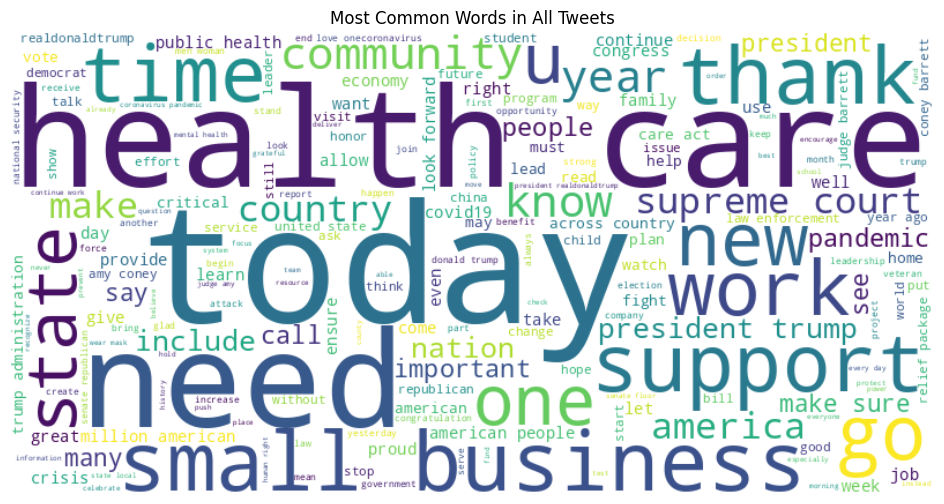

In [ ]:
wordcloud = WordCloud(width=800, height=400, background_color='white').generate(all_text) # Generating word cloud

# creating visuals for the word cloud:
plt.figure(figsize=(12, 6))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.title("Most Common Words in All Tweets")
plt.show()

# Vectorize Data

In [ ]:
%%time

tfidf = TfidfVectorizer(max_features=5000, stop_words='english')
X = tfidf.fit_transform(df1['clean_combined_text'])
y = df1['sentiment_label']  # Target
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

CPU times: user 1.52 s, sys: 3.98 ms, total: 1.53 s
Wall time: 1.54 s


<ipython-input-28-0981f0d7fe5d>:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=tfidf_scores.values, y=tfidf_scores.index, palette='viridis')


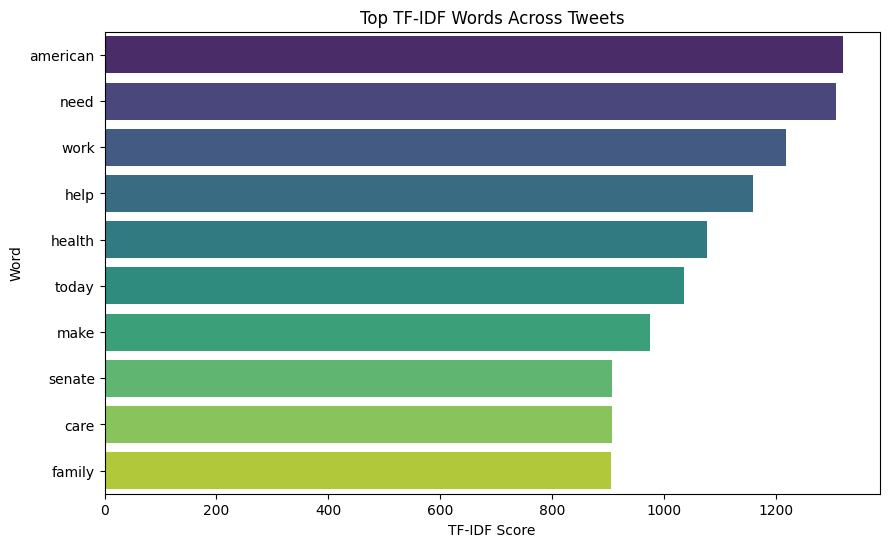

In [ ]:
# Use the already existing TF-IDF matrix and vectorizer
tfidf_matrix = X.toarray()  # X is your full tfidf vectorized dataset (5000 features)
feature_names = tfidf.get_feature_names_out()

# Convert to DataFrame
tfidf_df = pd.DataFrame(tfidf_matrix, columns=feature_names)

# Sum TF-IDF scores across all tweets
tfidf_scores = tfidf_df.sum().sort_values(ascending=False)

top_n = 10  # Top N scores of our choice.
tfidf_scores = tfidf_scores.head(top_n)

# Plot
plt.figure(figsize=(10,6))
sns.barplot(x=tfidf_scores.values, y=tfidf_scores.index, palette='viridis')
plt.title('Top TF-IDF Words Across Tweets')
plt.xlabel('TF-IDF Score')
plt.ylabel('Word')
plt.show()

# Algorithm Training & Model Evaluation

### Created a visual after training and evaluation to showcase model accuracy for 4 different models

                    Model  Accuracy
1  Support Vector Machine  0.926144
0     Logistic Regression  0.910347
2           Random Forest  0.876838
3             Naive Bayes  0.841277


<ipython-input-29-5a49e6b93c23>:24: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='Accuracy', y='Model', data=results_df, palette='viridis')


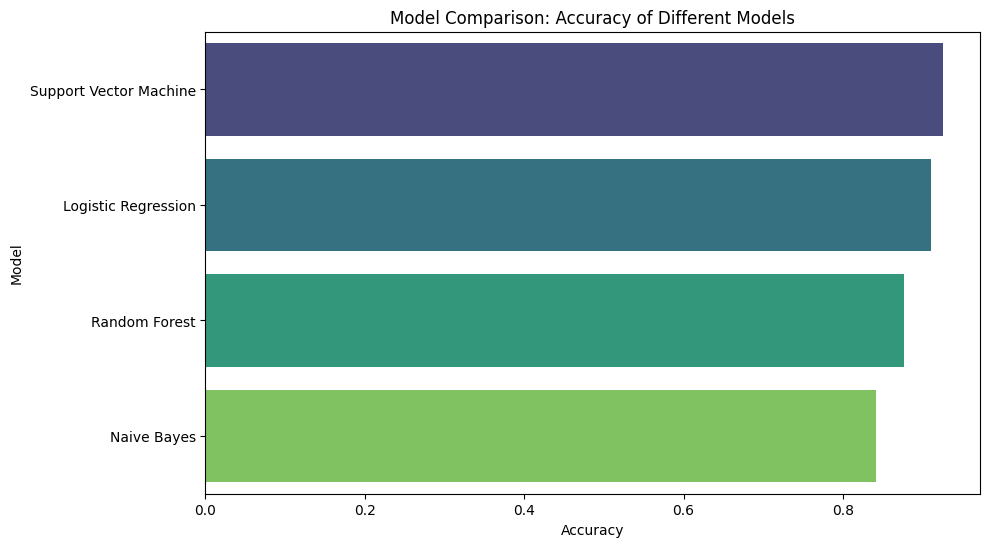

In [ ]:
# Define Models
models = {
    "Logistic Regression": LogisticRegression(max_iter=1000),
    "Support Vector Machine": SVC(kernel='linear'),
    "Random Forest": RandomForestClassifier(n_estimators=100),
    "Naive Bayes": MultinomialNB()
}

# Train and Evaluate
results = []

for model_name, model in models.items():
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)
    acc = accuracy_score(y_test, y_pred)
    results.append((model_name, acc))

# Show Results
results_df = pd.DataFrame(results, columns=['Model', 'Accuracy']).sort_values(by='Accuracy', ascending=False)
print(results_df)

# Plot Results
plt.figure(figsize=(10, 6))
sns.barplot(x='Accuracy', y='Model', data=results_df, palette='viridis')
plt.title('Model Comparison: Accuracy of Different Models')
plt.xlabel('Accuracy')
plt.ylabel('Model')
plt.show()


### Generating a confusion matrix for each model to show how well each model predicetd sentiment labels such as positive, negative, and neutral
### Rows representing the real label and columns representing what the model guessed

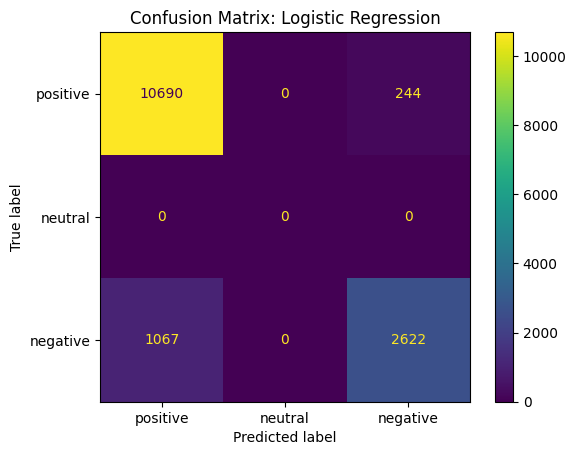

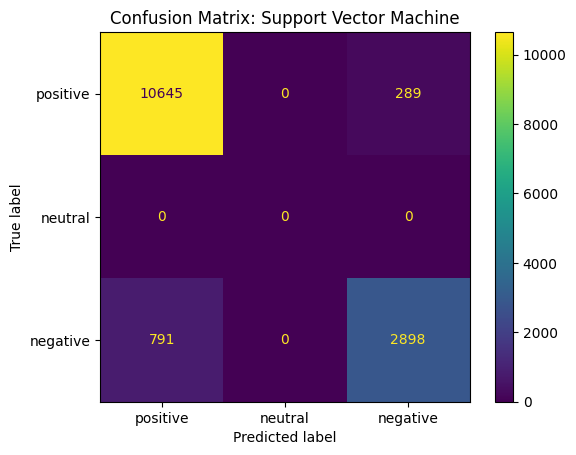

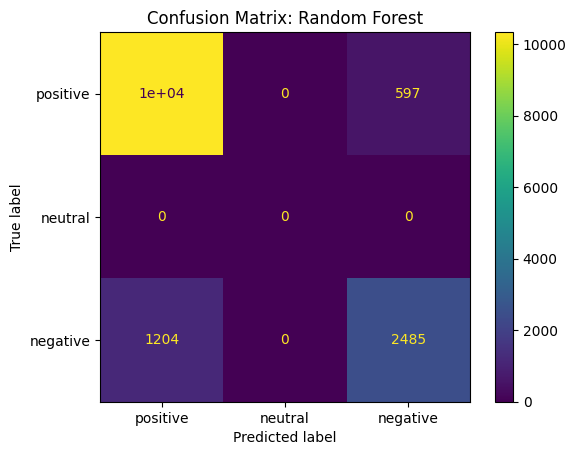

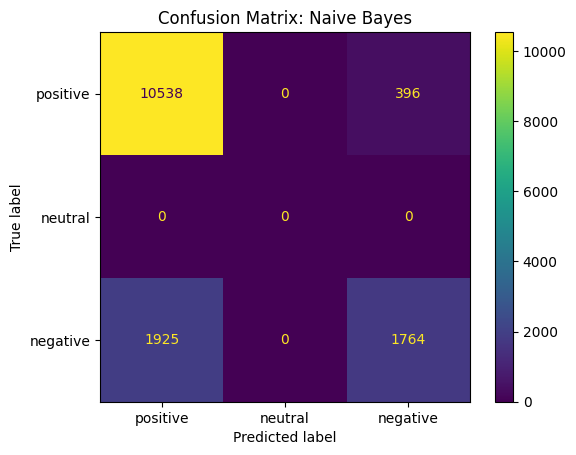

In [ ]:
for model_name, model in models.items():
    # Predict
    y_pred = model.predict(X_test)

    # Create confusion matrix
    cm = confusion_matrix(y_test, y_pred, labels=['positive', 'neutral', 'negative'])

    # Display
    disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=['positive', 'neutral', 'negative'])
    disp.plot(cmap='viridis')
    plt.title(f"Confusion Matrix: {model_name}")
    plt.show()

# BerTopic

## Install and Import Packages

In [ ]:
%%time

! pip install bertopic

CPU times: user 38.6 ms, sys: 9.01 ms, total: 47.7 ms
Wall time: 4.73 s


In [ ]:
import pandas as pd
import re
import string
import nltk
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer
from bertopic import BERTopic

## Setup BERTopic

In [ ]:
# To use the default model (all-MiniLM-L6-v2), you do not have to specify a model name
topic_model = BERTopic(nr_topics=200)

# Display default hyperparameters for model BERTopic
topic_model.get_params()

{'calculate_probabilities': False,
 'ctfidf_model': ClassTfidfTransformer(),
 'embedding_model': None,
 'hdbscan_model': HDBSCAN(min_cluster_size=10, prediction_data=True),
 'language': 'english',
 'low_memory': False,
 'min_topic_size': 10,
 'n_gram_range': (1, 1),
 'nr_topics': 200,
 'representation_model': None,
 'seed_topic_list': None,
 'top_n_words': 10,
 'umap_model': UMAP(low_memory=False, metric='cosine', min_dist=0.0, n_components=5),
 'vectorizer_model': CountVectorizer(),
 'verbose': False,
 'zeroshot_min_similarity': 0.7,
 'zeroshot_topic_list': None}

In [ ]:
%%time

# Train the BERTopic model on the cleaned combined text
topics, probs = topic_model.fit_transform(df1['clean_combined_text'])

CPU times: user 20min 51s, sys: 6.76 s, total: 20min 58s
Wall time: 20min 19s


In [ ]:
# Display topics
#  Topic_ID -1 : refers to outlier documents that do not fit well into any topics
#  Topic_ID 0 : groups together documents that have little meaning
#  Topic_ID 1 : the most frequent topic in the corpus
#  Topic_ID 2 and onwards : the 2nd, …, Nth most frequent topic in the corpus

topic_model.get_topics()

{-1: [('work', np.float64(0.004422367696732913)),
  ('need', np.float64(0.004315794064465646)),
  ('help', np.float64(0.004282932589983264)),
  ('relief', np.float64(0.003983055612710222)),
  ('american', np.float64(0.0039051390103350164)),
  ('get', np.float64(0.003784950706094348)),
  ('health', np.float64(0.00377597296126849)),
  ('family', np.float64(0.0037336869552286496)),
  ('covid19', np.float64(0.003700048441674292)),
  ('worker', np.float64(0.0036623022365120336))],
 0: [('vaccine', np.float64(0.026063612128786925)),
  ('coronavirus', np.float64(0.01461523867009636)),
  ('health', np.float64(0.010209146101099102)),
  ('test', np.float64(0.010104644865120353)),
  ('pandemic', np.float64(0.00973132833693061)),
  ('covid19', np.float64(0.00954372416837579)),
  ('telehealth', np.float64(0.009240494169316696)),
  ('effective', np.float64(0.008099654290755641)),
  ('care', np.float64(0.007469274296184056)),
  ('medical', np.float64(0.007293173153249374))],
 1: [('small', np.float64

In [ ]:
topic_model.get_topic_info()

,Topic,Count,Name,Representation,Representative_Docs
0,-1,28677,-1_work_need_help_relief,"[work, need, help, relief, american, get, health, family, covid19, worker]","[funding help government meet responsibility keep american healthy safe life stake president must act quickly deliver fund state local public health agency front line protect community, let clear president trump republican concerned rush scotus nominee get family worker community relief support need get pandemic american people deserve well, heard family worker small business owner community leader still face serious challenge covid19 pandemic need come together pas comprehensive bipartisan relief michigander get help need]"
1,0,3880,0_vaccine_coronavirus_health_test,"[vaccine, coronavirus, health, test, pandemic, covid19, telehealth, effective, care, medical]","[focus right provide american resource support need address impact covid19 pandemic include support effort help develop vaccine, think know vaccine vaccine go critical get economy move big watch video today senate commerce hearing vaccine distribution, information regard state covid19 vaccine distribution plan check distribution vaccine great front line health worker must work increase american confidence vaccine]"
2,1,2937,1_small_business_loan_ppp,"[small, business, loan, ppp, relief, unemployment, paycheckprotectionprogram, paycheck, sbagov, benefit]","[federal aid target worker family small business help get crisis push give american worker direct cash payment expand unemployment insurance help small business stay business, paycheckprotectionprogram provide billion relief must much help small business left stevedaines announce small business local relief fund help state community get capital small business, congress need get paycheckprotectionprogram loan funding small business must part provide additional relief worker employer]"
3,2,2644,2_barrett_court_judge_supreme,"[barrett, court, judge, supreme, aca, coney, amy, condition, nominee, scotus]","[nomination judge barrett supreme court threat affordable care act benefit coverage protection provide aca share let show president trump mitch mcconnell senate republican whatsatstake, statement president realdonaldtrump nomination judge amy coney barrett serve supreme court scotus, statement president trump supreme court nominee judge amy coney barrett]"
4,3,1505,3_china_chinese_communist_hong,"[china, chinese, communist, hong, kong, ccp, party, beijing, hongkong, human]","[chinese communist party threat new sanction silence speak egregious human right atrocity continue stand dissident freedom fighter hong kong shin light ccp oppression, hold china accountable covid19 protect america economy public health national security threat pose chinese government, necessary step toward hold chinese communist party accountable action hong kong always stand freedom democracy across globe]"
...,...,...,...,...,...
195,194,11,194_doug_jones_alabama_alpolitics,"[doug, jones, alabama, alpolitics, alabamian, acb, alsen, represent, onealabama, defeatdoug]","[doug jones represent alabama spend money world tv ad run record alsen, important time right doug jones fire president trump ask put together list supporter alabama back one alpolitics alsen, doug jones vote unborn child protection act two separate time represent alabama value]"
196,195,11,195_reminder_mofiremarshal_wallet_grab,"[reminder, mofiremarshal, wallet, grab, appropriate, important, et, attention, seem, door]","[reminder, reminder, reminder]"
197,196,11,196_uni_bradley_st_half,"[uni, bradley, st, half, evansville, player, northscott, ovr, illinois, qtr]","[uni behind illinois st half, uni indiana st half, uni bradley]"
198,197,11,197_entrepreneurship_innovate_forum_entrepreneur,"[entrepreneurship, innovate, forum, entrepreneur, 3rd, annual, nh, innovator, hampshire, 7th]","[join monday 10 3rd annual innovate nh entrepreneurship forum sign today, tomorrow join new hampshire entrepreneur 3rd annual innovate nh en

In [ ]:
# Display list of words and their weights that comprise Topic 1
topic_model.get_topic(1)

[('small', np.float64(0.024798592580424376)),
 ('business', np.float64(0.02431676220530857)),
 ('loan', np.float64(0.020950718229740335)),
 ('ppp', np.float64(0.019947902172495254)),
 ('relief', np.float64(0.015097800105902247)),
 ('unemployment', np.float64(0.012825779281046994)),
 ('paycheckprotectionprogram', np.float64(0.01245269126154731)),
 ('paycheck', np.float64(0.010901133929477901)),
 ('sbagov', np.float64(0.010021729480220698)),
 ('benefit', np.float64(0.00922590204108714))]

In [ ]:
# Display the embeddings for Topic 1
topic_model.topic_embeddings_[1]

array([-1.74222291e-02,  2.40807424e-02,  4.81363936e-03, -1.14328979e-02,
        3.01218409e-02,  3.80802547e-02,  8.92498526e-03,  1.17306744e-02,
       -4.28569599e-02,  3.97900447e-03,  1.92069855e-03, -2.50435501e-03,
       -4.96233353e-04,  1.04461945e-02, -2.28060398e-02, -9.57918569e-03,
        1.06937524e-02, -3.23844169e-02, -1.97495473e-02,  1.29183082e-02,
       -3.72105220e-02,  4.61088103e-02,  9.76885713e-03,  1.31991446e-02,
       -4.90337214e-02,  2.66722779e-02, -4.12006789e-02, -7.22326768e-03,
        1.78842441e-02, -2.80946353e-04,  4.86121056e-02, -1.43619608e-02,
        5.48893747e-03,  1.54457448e-02,  1.61425453e-02,  7.45949236e-03,
        1.32770917e-02,  1.29983037e-02, -9.18426239e-03,  4.80094699e-03,
       -3.73400456e-03, -3.22815234e-02,  1.30233000e-02,  6.62683303e-03,
        2.00857177e-02,  8.34056679e-04, -4.62803946e-02,  1.87570418e-02,
        4.68735806e-02,  7.25340304e-03, -2.45660894e-02, -5.13092860e-02,
        2.27415562e-03,  

In [ ]:
#topic_model.get_document_info(df1['clean_combined_text'])
topic_info_df = topic_model.get_document_info(df1['clean_combined_text'])
topic_info_df.head()

,Document,Topic,Name,Representation,Representative_Docs,Top_n_words,Probability,Representative_document
0,alaskan proven resilience time time face disaster remain commit help equip tool resource need keep alaskan across state safe possible,-1,-1_work_need_help_relief,"[work, need, help, relief, american, get, health, family, covid19, worker]","[funding help government meet responsibility keep american healthy safe life stake president must act quickly deliver fund state local public health agency front line protect community, let clear president trump republican concerned rush scotus nominee get family worker community relief support need get pandemic american people deserve well, heard family worker small business owner community leader still face serious challenge covid19 pandemic need come together pas comprehensive bipartisan relief michigander get help need]",work - need - help - relief - american - get - health - family - covid19 - worker,0.000000,False
1,proud interior appropriation bill recently sign law take important step develop improve earthquake volcano monitoring capability modernize 3d alaska mapping provide support wildland fire management suppression,4,4_park_water_land_outdoors,"[park, water, land, outdoors, lwcf, conservation, outdoor, lake, great, national]","[california home national park state know value public land provide proud support great american outdoors act ensure dedicate funding land conservation recreation maintenance public land, must quickly pas great american outdoors act bipartisan legislation provide full funding land water conservation fund lwcf address defer maintenance backlog national park include acadia national park, update senate pass great american outdoors act bipartisan bill cosponsor provide full funding land water conservation fund lwcf address defer maintenance backlog national park include acadia national park]",park - water - land - outdoors - lwcf - conservation - outdoor - lake - great - national,0.951591,False
2,proud nearly 900 billion covid19 relief package recently sign law include significant funding support another round ppp small business desperate need assistance,1,1_small_business_loan_ppp,"[small, business, loan, ppp, relief, unemployment, paycheckprotectionprogram, paycheck, sbagov, benefit]","[federal aid target worker family small business help get crisis push give american worker direct cash payment expand unemployment insurance help small business stay business, paycheckprotectionprogram provide billion relief must much help small business left stevedaines announce small business local relief fund help state community get capital small business, congress need get paycheckprotectionprogram loan funding small business must part provide additional relief worker employer]",small - business - loan - ppp - relief - unemployment - paycheckprotectionprogram - paycheck - sbagov - benefit,1.000000,False
3,paycheck protection program critical help american worker small business navigate covid19 pandemic,1,1_small_business_loan_ppp,"[small, business, loan, ppp, relief, unemployment, paycheckprotectionprogram, paycheck, sbagov, benefit]","[federal aid target worker family small business help get crisis push give american worker direct cash payment expand unemployment insurance help small business stay business, paycheckprotectionprogram provide billion relief must much help small business left stevedaines announce small business local relief fund help state community get capital small business, congress need get paycheckprotectionprogram loan funding small business must part provide additional relief worker employer]",small - business - loan - ppp - relief - unemployment - paycheckprotectionprogram - paycheck - sbagov - benefit,0.761444,False
4,reach agreement take significant bipartisan compromise member across board proud part good work president decision sign legislation without delay include critical covid19 relief welcome news,-1,-1_work_need_help_relief,"[work, nee

In [ ]:
# Display topic sizes
#  topic_ID : # of documents assigned to topic
topic_model.topic_sizes_

Counter({-1: 28677,
         4: 1224,
         1: 2937,
         62: 175,
         0: 3880,
         18: 512,
         27: 397,
         6: 1073,
         36: 341,
         12: 782,
         81: 112,
         68: 154,
         10: 895,
         96: 85,
         78: 114,
         13: 751,
         104: 69,
         43: 288,
         17: 534,
         71: 130,
         63: 170,
         11: 843,
         60: 191,
         25: 409,
         15: 694,
         75: 121,
         19: 487,
         67: 160,
         31: 361,
         77: 115,
         33: 354,
         39: 317,
         99: 81,
         14: 730,
         7: 1020,
         115: 55,
         2: 2644,
         49: 235,
         82: 110,
         22: 450,
         119: 49,
         28: 388,
         86: 103,
         9: 906,
         101: 76,
         26: 407,
         57: 198,
         74: 122,
         38: 317,
         103: 74,
         34: 352,
         93: 90,
         61: 187,
         156: 20,
         98: 82,
         162:

In [ ]:
# Display the representative docs for Topic 1
topic_model.get_representative_docs(1)

['federal aid target worker family small business help get crisis push give american worker direct cash payment expand unemployment insurance help small business stay business',
 'paycheckprotectionprogram provide billion relief must much help small business left stevedaines announce small business local relief fund help state community get capital small business',
 'congress need get paycheckprotectionprogram loan funding small business must part provide additional relief worker employer']

# Join Datasets and Output

In [ ]:
# Merge on 'username'
merged_df = pd.merge(df1,df2 , on='username', how='inner')  # Inner join by default
merged_df.head()

,Unnamed: 0,username,date,tweet_id,tweet_content,tweet_url,combined_text,clean_combined_text,generated_sentiment,sentiment_label,state,senator,party,age,election_winner,election_year,incumbent,margin_of_victory
0,0,lisamurkowski,2020-12-31 18:06:21+00:00,1344706472052142083,Alaskans have proven their resilience time and time again in the face of disaster. I remain committed to helping equip them with the tools and resources they need to keep Alaskans across the state as safe as possible. https://t.co/T2M6Oh1SyA,https://twitter.com/lisamurkowski/status/1344706472052142083,Alaskans have proven their resilience time and time again in the face of disaster. I remain committed to helping equip them with the tools and resources they need to keep Alaskans across the state as safe as possible. https://t.co/T2M6Oh1SyA,alaskan proven resilience time time face disaster remain commit help equip tool resource need keep alaskan across state safe possible,0.4019,positive,ALASKA,Lisa Murkowski,Republican,63.0,True,2022,True,6.3
1,1,lisamurkowski,2020-12-31 18:06:20+00:00,1344706470055714819,"I’m proud that my Interior Appropriations bill, which was recently signed into law, takes important steps to further develop &amp; improve earthquake &amp; volcano monitoring capabilities, modernize 3D Alaska mapping, &amp; provide support for wildland fire management &amp; suppression. https://t.co/2uTgDOvarn",https://twitter.com/lisamurkowski/status/1344706470055714819,"I’m proud that my Interior Appropriations bill, which was recently signed into law, takes important steps to further develop &amp; improve earthquake &amp; volcano monitoring capabilities, modernize 3D Alaska mapping, &amp; provide support for wildland fire management &amp; suppression. https://t.co/2uTgDOvarn",proud interior appropriation bill recently sign law take important step develop improve earthquake volcano monitoring capability modernize 3d alaska mapping provide support wildland fire management suppression,0.7964,positive,ALASKA,Lisa Murkowski,Republican,63.0,True,2022,True,6.3
2,2,lisamurkowski,2020-12-30 01:13:26+00:00,1344089179207118848,"I’m proud that the nearly $900 billion #COVID19 Relief package, which was recently signed into law, includes significant funding to support another round of #PPP to our hardest-hit small businesses in desperate need of assistance. https://t.co/m2rmAy7VZq",https://twitter.com/lisamurkowski/status/1344089179207118848,"I’m proud that the nearly $900 billion #COVID19 Relief package, which was recently signed into law, includes significant funding to support another round of #PPP to our hardest-hit small businesses in desperate need of assistance. https://t.co/m2rmAy7VZq",proud nearly 900 billion covid19 relief package recently sign law include significant funding support another round ppp small business desperate need assistance,0.8126,positive,ALASKA,Lisa Murkowski,Republican,63.0,True,2022,True,6.3
3,3,lisamurkowski,2020-12-30 01:13:26+00:00,1344089177663688704,The Paycheck Protection Program has been critical in helping American workers and small businesses navigate the #COVID19 pandemic. https://t.co/OnI8r8Ek4t,https://twitter.com/lisamurkowski/status/1344089177663688704,The Paycheck Protection Program has been critical in helping American workers and small businesses navigate the #COVID19 pandemic. https://t.co/OnI8r8Ek4t,paycheck protection program critical help american worker small business navigate covid19 pandemic,0.1027,positive,ALASKA,Lisa Murkowski,Republican,63.0,True,2022,True,6.3
4,4,lisamurkowski,2020-12-29 00:59:39+00:00,1343723320030744578,"Reaching this agreement took significant bipartisan compromise from members across the board, and I’m proud to have been a part of that good work. The President’s decision to sign this legislation without further delay, which includes critical #COVID19 relief, is welcomed news.",https://twitter.com/lisamurkowski/status/1343723320030744578,"Reaching this agreement took significant bipartisa

In [ ]:
df1_with_topics = pd.concat([merged_df.reset_index(drop=True), topic_info_df.reset_index(drop=True)], axis=1)

In [ ]:
df1_with_topics = df1_with_topics.drop(columns=['Document'])

In [ ]:
df1_with_topics.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 73111 entries, 0 to 73110
Data columns (total 25 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   Unnamed: 0               72110 non-null  float64
 1   username                 72110 non-null  object 
 2   date                     72110 non-null  object 
 3   tweet_id                 72110 non-null  float64
 4   tweet_content            72110 non-null  object 
 5   tweet_url                72110 non-null  object 
 6   combined_text            72110 non-null  object 
 7   clean_combined_text      72110 non-null  object 
 8   generated_sentiment      72110 non-null  float64
 9   sentiment_label          72110 non-null  object 
 10  state                    72110 non-null  object 
 11  senator                  72110 non-null  object 
 12  party                    72110 non-null  object 
 13  age                      72110 non-null  float64
 14  election_winner       

In [ ]:
df1_with_topics.head(2)

,Unnamed: 0,username,date,tweet_id,tweet_content,tweet_url,combined_text,clean_combined_text,generated_sentiment,sentiment_label,...,election_year,incumbent,margin_of_victory,Topic,Name,Representation,Representative_Docs,Top_n_words,Probability,Representative_document
0,0.0,lisamurkowski,2020-12-31 18:06:21+00:00,1.344706e+18,Alaskans have proven their resilience time and time again in the face of disaster. I remain committed to helping equip them with the tools and resources they need to keep Alaskans across the state as safe as possible. https://t.co/T2M6Oh1SyA,https://twitter.com/lisamurkowski/status/1344706472052142083,Alaskans have proven their resilience time and time again in the face of disaster. I remain committed to helping equip them with the tools and resources they need to keep Alaskans across the state as safe as possible. https://t.co/T2M6Oh1SyA,alaskan proven resilience time time face disaster remain commit help equip tool resource need keep alaskan across state safe possible,0.4019,positive,...,2022.0,True,6.3,-1,-1_work_need_help_relief,"[work, need, help, relief, american, get, health, family, covid19, worker]","[funding help government meet responsibility keep american healthy safe life stake president must act quickly deliver fund state local public health agency front line protect community, let clear president trump republican concerned rush scotus nominee get family worker community relief support need get pandemic american people deserve well, heard family worker small business owner community leader still face serious challenge covid19 pandemic need come together pas comprehensive bipartisan relief michigander get help need]",work - need - help - relief - american - get - health - family - covid19 - worker,0.000000,False
1,1.0,lisamurkowski,2020-12-31 18:06:20+00:00,1.344706e+18,"I’m proud that my Interior Appropriations bill, which was recently signed into law, takes important steps to further develop &amp; improve earthquake &amp; volcano monitoring capabilities, modernize 3D Alaska mapping, &amp; provide support for wildland fire management &amp; suppression. https://t.co/2uTgDOvarn",https://twitter.com/lisamurkowski/status/1344706470055714819,"I’m proud that my Interior Appropriations bill, which was recently signed into law, takes important steps to further develop &amp; improve earthquake &amp; volcano monitoring capabilities, modernize 3D Alaska mapping, &amp; provide support for wildland fire management &amp; suppression. https://t.co/2uTgDOvarn",proud interior appropriation bill recently sign law take important step develop improve earthquake volcano monitoring capability modernize 3d alaska mapping provide support wildland fire management suppression,0.7964,positive,...,2022.0,True,6.3,4,4_park_water_land_outdoors,"[park, water, land, outdoors, lwcf, conservation, outdoor, lake, great, national]","[california home national park state know value public land provide proud support great american outdoors act ensure dedicate funding land conservation recreation maintenance public land, must quickly pas great american outdoors act bipartisan legislation provide full funding land water conservation fund lwcf address defer maintenance backlog national park include acadia national park, update senate pass great american outdoors act bipartisan bill cosponsor provide full funding land water conservation fund lwcf address defer maintenance backlog national park include acadia national park]",park - water - land - outdoors - lwcf - conservation - outdoor - lake - great - national,0.951591,False


In [ ]:
#from google.colab import files
#df1_with_topics.to_csv('df1_with_topics.csv',  index=False)  # Saves the DataFrame as a CSV file
#files.download('df1_with_topics.csv')  # Downloads the file to your local syst